# Лабораторна №3
# Лінійна фільтрація зображень. Виділення границь


## Завдання
1. Виконати інвертування кольорової інтенсивності пікселів завантаженого зображення. Вивести вхідне та отримане зображення;
2. Для однієї з компонент виконати зміну, наприклад до кожного піікселя додати якусь константу
3. Виконати розбивку зображення на компоненти R, G, B
4. Виконати **злиття двох зображень** у певних пропорціях. За додаткові бали злиття анімоване. **
5. Виконати фільтрацію вхідного зображення з використанням **матричних фільтрів:**   
фільтр розмиття, фільтр поліпшення чіткості, медіанний фільтр, фільтр ерозії і нарощування та фільтр Собеля.
6. Виконати **вбудовування водяного знаку** в зображення в канал Blue, використавши метод значущого біта.
7. За додатковий бал створити метод, який виконує **вилучення водяного знаку**. **

In [310]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter

In [311]:
plt.rcParams['figure.figsize'] = [12, 8]

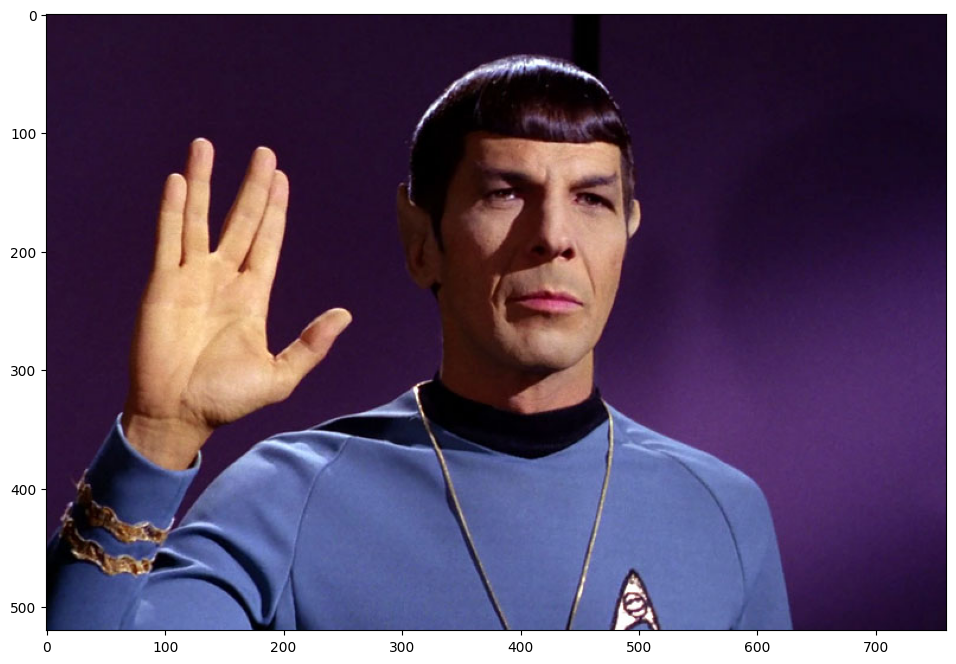

In [312]:
img = cv2.imread(r"D:\University\semestr_7\mmrokz\imgs\spoke.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

## 1. Інвертування 

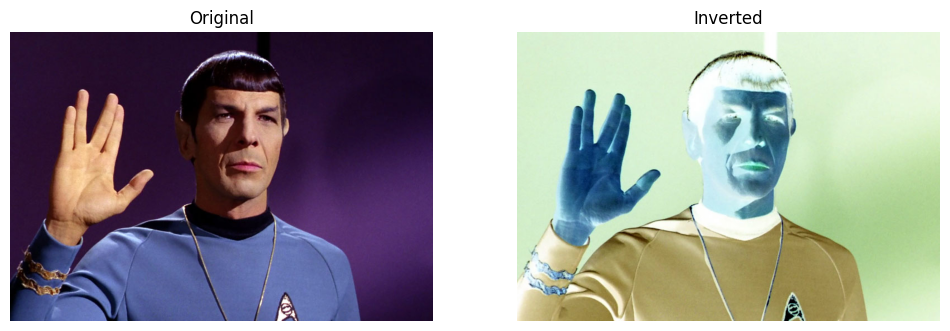

In [313]:
inverted = 255 - img
plt.subplot(1,2,1); plt.title('Original'); plt.axis('off'); plt.imshow(img)
plt.subplot(1,2,2); plt.title('Inverted'); plt.axis('off'); plt.imshow(inverted)
plt.show()


## 2. Додавання константи

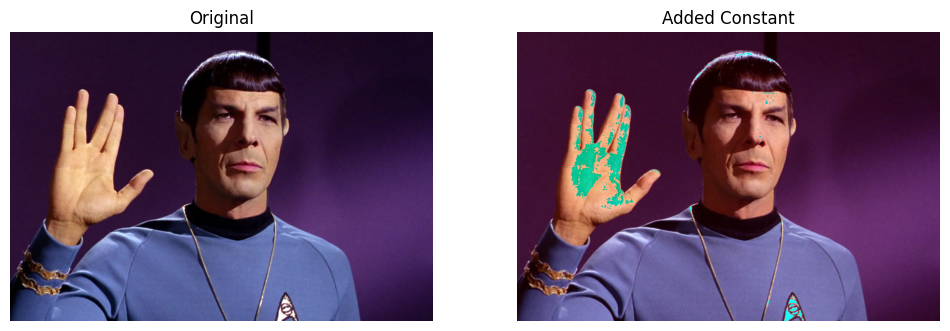

In [314]:
added_constant = img.copy()
added_constant[:,:,0] = img[:, :, 0] + 20
plt.subplot(1,2,1); plt.title('Original'); plt.axis('off'); plt.imshow(img)
plt.subplot(1,2,2); plt.title('Added Constant'); plt.axis('off'); plt.imshow(added_constant)
plt.show()

## 3. Розбивка зображення на r, g, b

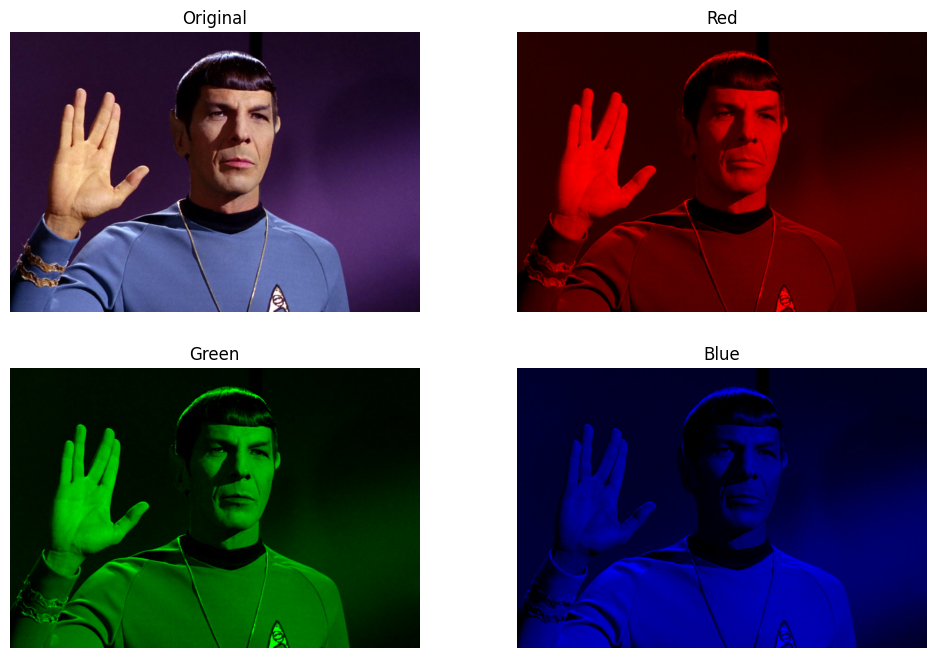

In [315]:
red_img = img.copy()
red_img[:,:,1] = 0
red_img[:,:,2] = 0
green_img = img.copy()
green_img[:,:,0] = 0
green_img[:,:,2] = 0
blue_img = img.copy()
blue_img[:,:,0] = 0
blue_img[:,:,1] = 0
plt.subplot(2,2,1); plt.title('Original'); plt.axis('off'); plt.imshow(img)
plt.subplot(2,2,2); plt.title('Red'); plt.axis('off'); plt.imshow(red_img)
plt.subplot(2,2,3); plt.title('Green'); plt.axis('off'); plt.imshow(green_img)
plt.subplot(2,2,4); plt.title('Blue'); plt.axis('off'); plt.imshow(blue_img)
plt.show()

## 4. Злиття двох зображень

In [316]:
img_max = cv2.imread(r"D:\University\semestr_7\mmrokz\imgs\max.jpg")
img_max = cv2.cvtColor(img_max, cv2.COLOR_BGR2RGB)

In [317]:
img_vietnam = cv2.imread(r"D:\University\semestr_7\mmrokz\imgs\vietnam.jpg")
img_vietnam = cv2.cvtColor(img_vietnam, cv2.COLOR_BGR2RGB)

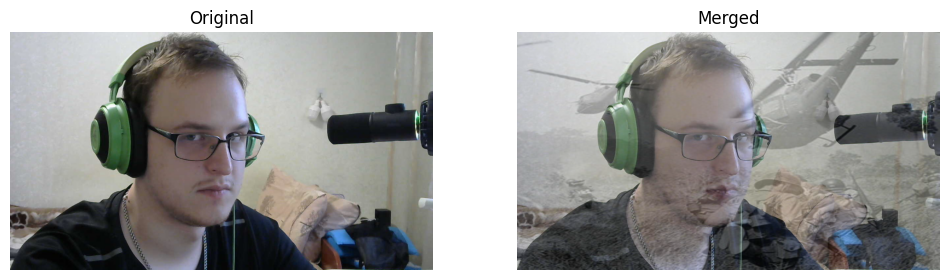

In [318]:
def merge_images(alpha, img1, img2):
    img2_resized = cv2.resize(img2, (img1.shape[1], img1.shape[0]))
    
    merged = img1.astype(float) * alpha + img2_resized.astype(float) * (1 - alpha)
    return merged.astype(img1.dtype)

merged = merge_images(0.7, img_max, img_vietnam)
plt.subplot(1,2,1); plt.title('Original'); plt.axis('off'); plt.imshow(img_max)
plt.subplot(1,2,2); plt.title('Merged'); plt.axis('off'); plt.imshow(merged)
plt.show()

### Анімація злиття

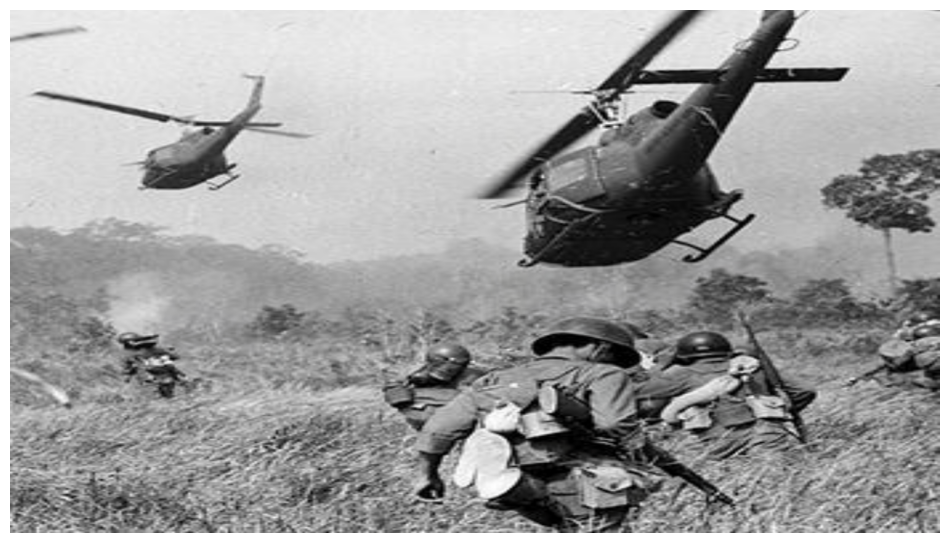

In [319]:
# alphas = np.arange(1.0, -0.01, -0.01)

# fig, ax = plt.subplots()
# ax.axis('off')
# im = ax.imshow(merge_images(alphas[0], img_max, img_vietnam))

# def update(frame):
#     merged = merge_images(alphas[frame], img_max, img_vietnam)
#     im.set_data(merged)
#     return [im]

# ani = FuncAnimation(fig, update, frames=len(alphas), blit=True)

# ani.save("transition.gif", writer=PillowWriter(fps=20))


## 5. Фільтрація матричними фільтрами

In [320]:
# базовий варіант
def filter(image, kernel):
    image_height, image_width, num_channels = image.shape
    kernel_height, kernel_width = kernel.shape
    padding = max(kernel_height//2, kernel_width//2)  
    padded_image = np.pad(image,  ((padding, padding), (padding, padding), (0,0)), mode='edge')

    filtered_image = np.zeros_like(image, dtype=float)

    for c in range(num_channels):
        for i in range(image_height):
            for j in range(image_width):
                patch = padded_image[i:i + kernel_height, j:j + kernel_width, c]
                filtered_pixel = np.sum(patch * kernel)
                filtered_image[i, j, c] = filtered_pixel

    result_uint8 = np.clip(filtered_image, 0, 255).astype(np.uint8)
            
    return result_uint8

In [321]:
# векторизований варіант
def filter_vectorized(image, kernel):
    image_height, image_width, num_channels = image.shape
    kernel_height, kernel_width = kernel.shape
    pad_h = kernel_height // 2
    pad_w = kernel_width // 2

    padded_image = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w), (0,0)), mode='edge')

    filtered_image = np.zeros_like(image, dtype=float)

    for c in range(num_channels):
        for i in range(kernel_height):
            for j in range(kernel_width):
                filtered_image[:, :, c] += kernel[i, j] * padded_image[i:i+image_height, j:j+image_width, c]

    return np.clip(filtered_image, 0, 255).astype(np.uint8)

In [345]:
# фільтр розмиття
def gaussian_kernel(size, sigma):
    kernel = np.fromfunction(
        lambda x, y: (1/(2*np.pi*sigma**2)) * np.exp(-((x - (size-1)/2)**2 + (y - (size-1)/2)**2) / (2*sigma**2)),
        (size, size)
    )
    return kernel / np.sum(kernel)

In [351]:
img_kodim = cv2.imread(r"D:\University\semestr_7\mmrokz\imgs\kodim07.png")
img_kodim = cv2.cvtColor(img_kodim, cv2.COLOR_BGR2RGB)

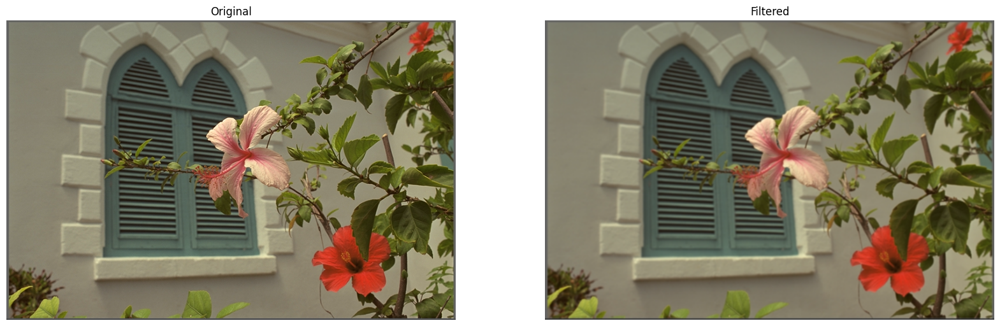

In [355]:
gaussian_kernel_test = gaussian_kernel(7, 1)
gaussian_kernel_test = gaussian_kernel_test / gaussian_kernel_test.sum()
filtered_image = filter_vectorized(img_kodim, gaussian_kernel_test)
plt.figure(figsize=(20, 16))
plt.subplot(1,2,1); plt.title('Original'); plt.axis('off'); plt.imshow(img_kodim)
plt.subplot(1,2,2); plt.title('Filtered'); plt.axis('off'); plt.imshow(filtered_image)
plt.show()

In [325]:
# фільтр поліпшення чіткості
def border():
    return np.array([
        [-1, -1, -1,],
        [-1, 9, -1,],
        [-1, -1, -1,],
        ], dtype=np.float32)

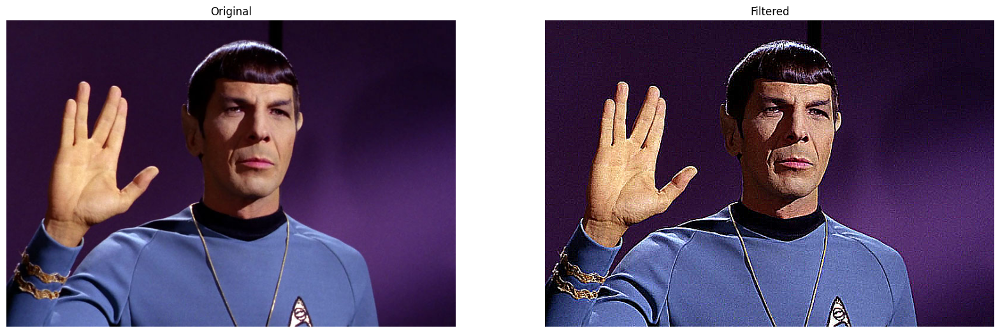

In [326]:
border_kernel = border()
filtered_image = filter_vectorized(img, border_kernel)
plt.figure(figsize=(20, 16))
plt.subplot(1,2,1); plt.title('Original'); plt.axis('off'); plt.imshow(img)
plt.subplot(1,2,2); plt.title('Filtered'); plt.axis('off'); plt.imshow(filtered_image) 
plt.show()

In [327]:
def morphology_kernel():
    return np.array([[0,1,0],
                   [1,1,1],
                   [0,1,0]], dtype=np.uint8)

In [328]:
def erode_image(image, kernel):
    image = image.astype(float)
    
    H, W, C = image.shape
    kh, kw = kernel.shape
    pad_h = kh // 2
    pad_w = kw // 2

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w), (0,0)), mode='edge')
    eroded = np.zeros_like(image)

    # Ерозія = мінімум по вікну ядра
    for c in range(C):
        for i in range(kh):
            for j in range(kw):
                eroded[:, :, c] = np.minimum(eroded[:, :, c], padded[i:i+H, j:j+W, c]) if i+j>0 else padded[i:i+H, j:j+W, c]

    return eroded.astype(np.uint8)

def dilate_image(image, kernel):

    image = image.astype(float)

    H, W, C = image.shape
    kh, kw = kernel.shape
    pad_h = kh // 2
    pad_w = kw // 2

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w), (0,0)), mode='edge')
    dilated = np.zeros_like(image)

    for c in range(C):
        for i in range(kh):
            for j in range(kw):
                dilated[:, :, c] = np.maximum(dilated[:, :, c], padded[i:i+H, j:j+W, c])

    return dilated.astype(np.uint8)

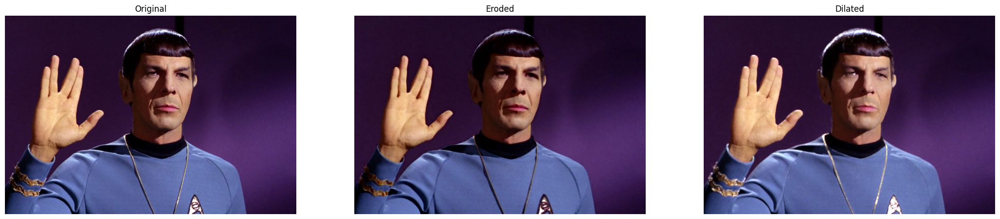

In [329]:
mor_kernel = morphology_kernel()

eroded_img = erode_image(img, mor_kernel)
dilated_img = dilate_image(img, mor_kernel)
plt.figure(figsize=(26, 16))
plt.subplot(1,3,1); plt.title('Original'); plt.axis('off'); plt.imshow(img)
plt.subplot(1,3,2); plt.title('Eroded'); plt.axis('off'); plt.imshow(eroded_img)
plt.subplot(1,3,3); plt.title('Dilated'); plt.axis('off'); plt.imshow(dilated_img)
plt.show()

In [330]:
# медіанний фільтер
def median_filter_vectorized(image, kernel_size):

    H, W, C = image.shape
    pad = kernel_size // 2
    padded = np.pad(image, ((pad, pad), (pad, pad), (0,0)), mode='edge')

    patches = np.zeros((H, W, kernel_size * kernel_size, C), dtype=padded.dtype)

    idx = 0
    for i in range(kernel_size):
        for j in range(kernel_size):
            patches[:, :, idx, :] = padded[i:i+H, j:j+W, :]
            idx += 1

    filtered = np.median(patches, axis=2)

    return filtered.astype(np.uint8)


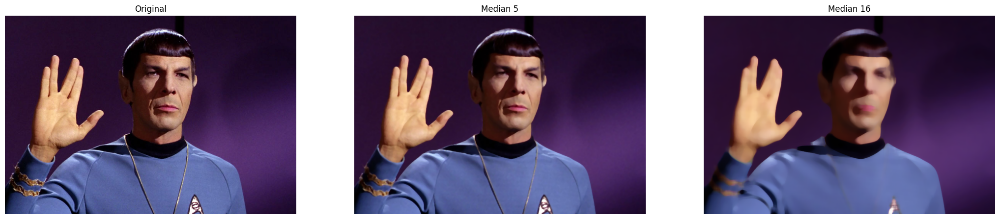

In [331]:
median_5 = median_filter_vectorized(img, 5)
median_16 = median_filter_vectorized(img, 16)
plt.figure(figsize=(26, 16))
plt.subplot(1,3,1); plt.title('Original'); plt.axis('off'); plt.imshow(img)
plt.subplot(1,3,2); plt.title('Median 5'); plt.axis('off'); plt.imshow(median_5)
plt.subplot(1,3,3); plt.title('Median 16'); plt.axis('off'); plt.imshow(median_16)

In [333]:
def sobel(image):
    Kx = np.array([[-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]], dtype=float)
    Ky = np.array([[-1, -2, -1],
                   [ 0,  0,  0],
                   [ 1,  2,  1]], dtype=float)
    
    H, W, C = image.shape
    pad = 1
    padded = np.pad(image, ((pad, pad), (pad, pad), (0,0)), mode='edge')
    
    G = np.zeros_like(image, dtype=float)
    
    for c in range(C):
        for i in range(H):
            for j in range(W):
                region = padded[i:i+3, j:j+3, c]
                gx = np.sum(Kx * region)
                gy = np.sum(Ky * region)
                G[i, j, c] = np.sqrt(gx**2 + gy**2)
    
    return np.clip(G, 0, 255).astype(np.uint8)

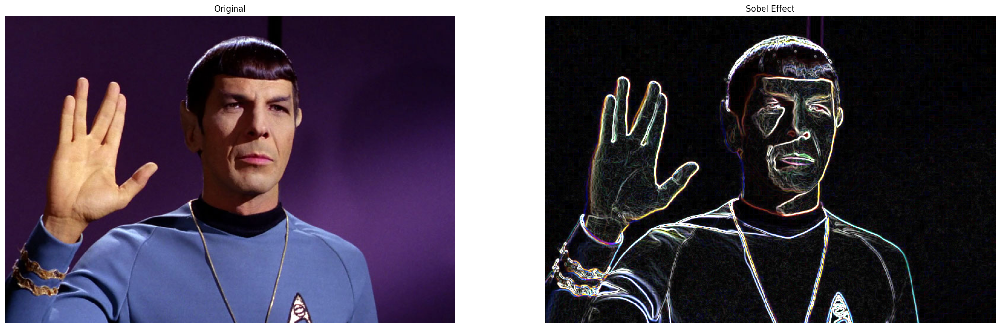

In [334]:
sobel_vectorized_img = sobel(img)
plt.figure(figsize=(26, 16))
plt.subplot(1,2,1); plt.title('Original'); plt.axis('off'); plt.imshow(img)
plt.subplot(1,2,2); plt.title('Sobel Effect'); plt.axis('off'); plt.imshow(sobel_vectorized_img)


## 6. Вбудовування водяного знаку

In [335]:
wm_image = cv2.imread(r'D:\University\semestr_7\mmrokz\imgs\WM.png', cv2.IMREAD_GRAYSCALE)
_, wm_binary = cv2.threshold(wm_image,165, 255, cv2.THRESH_BINARY)

input_image = cv2.imread(r'D:\University\semestr_7\mmrokz\imgs\InputImage.png')
input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)

bigger_image =  cv2.imread(r'D:\University\semestr_7\mmrokz\imgs\doggy.jpg')
bigger_image = cv2.cvtColor(bigger_image, cv2.COLOR_BGR2RGB)

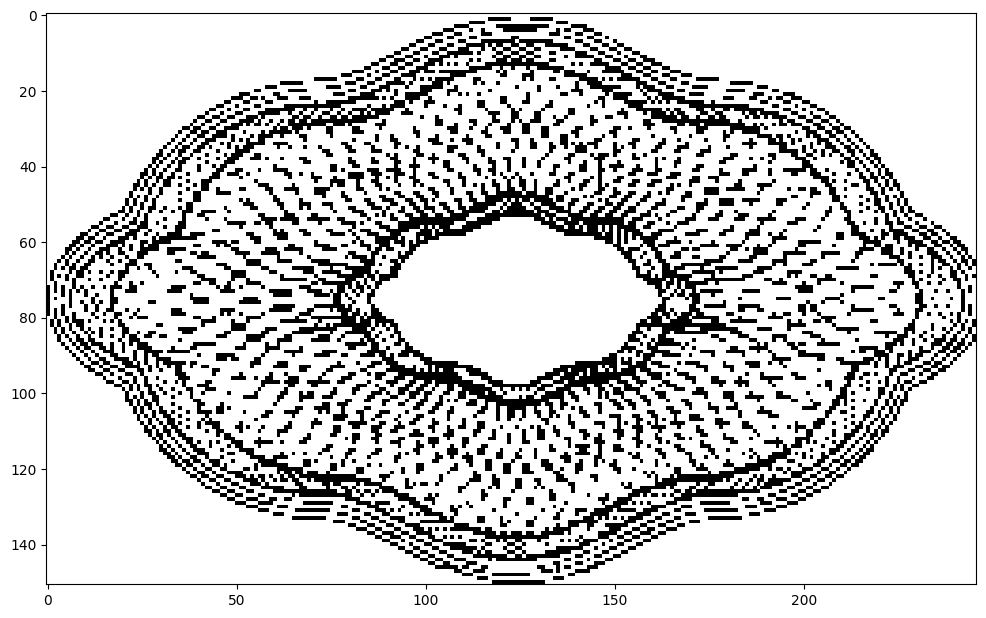

In [336]:
plt.imshow(wm_binary, cmap='gray')

In [337]:
def update_wm(image, h_new, w_new):
    """
    Make watermark as large as container
    """
    h, w = image.shape
    while True:
        image = np.concatenate((image, image), axis=1)
        if image.shape[1]>w_new:
            break
    while True:
        image = np.concatenate((image, image), axis=0)
        if image.shape[0]>h_new:
            break
    image = image[:h_new, :w_new]
    return image

In [338]:
def insert_wm(container, wm, bit):

    h_c, w_c, _ = container.shape
    h_wm, w_wm = wm.shape

    
    if h_wm < h_c or w_wm < w_c:
        wm = update_wm(wm, h_c, w_c)
    if h_wm > h_c or w_wm > w_c:
        wm = wm[:h_c, :w_c]

    wm = wm & 1

    r, g, b = cv2.split(container)

    b_unpacked = np.unpackbits(b[:,:,np.newaxis], axis=2)

    b_unpacked[:,:, -bit] = b_unpacked[:,:, -bit] ^ wm

    b_packed = np.packbits(b_unpacked, axis=2)
    b_new = b_packed.reshape(b_packed.shape[0], b_packed.shape[1])

    return cv2.merge((r, g, b_new))


In [339]:
def extract_wm(container, watermarked, bit=1):
    """
    Витягування водяного знаку через XOR різниці між контейнером і вбудованим зображенням
    """
    # Сині канали
    _, _, b_c = cv2.split(container)
    _, _, b_w = cv2.split(watermarked)

    # Перетворення у біти
    bits_c = np.unpackbits(b_c[:, :, np.newaxis], axis=2)[:, :, -bit]
    bits_w = np.unpackbits(b_w[:, :, np.newaxis], axis=2)[:, :, -bit]

    # XOR -> відновлений WM
    wm = bits_c ^ bits_w

    return (wm * 255).astype(np.uint8)

In [340]:
def recover_original(watermarked, wm_bits, bit):

    r, g, b = cv2.split(watermarked)

    b_bits = np.unpackbits(b[:, :, np.newaxis], axis=2)

    b_bits[:, :, -bit] = b_bits[:, :, -bit] ^ wm_bits

    b_rec = np.packbits(b_bits, axis=2).reshape(b.shape)
    recovered = cv2.merge((r, g, b_rec))
    return recovered

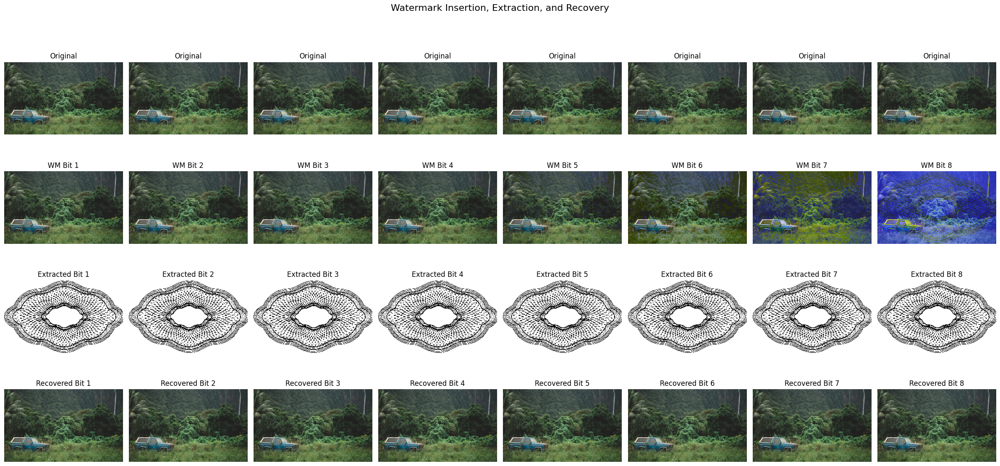

In [341]:

images_wm = []
for bit_value in range(1, 9):
    image_with_text = insert_wm(input_image, wm_binary, bit_value)
    images_wm.append(image_with_text)


wms = []
for i in range(8):
    wm = extract_wm(input_image, images_wm[i], i+1)
    wms.append(wm)


recovered_images = []
for i in range(8):
    wm = extract_wm(input_image, images_wm[i], i+1)  
    rec = recover_original(images_wm[i], wm//255, i+1)  
    recovered_images.append(rec)


fig, axes = plt.subplots(4, 8, figsize=(24, 12))
fig.suptitle('Watermark Insertion, Extraction, and Recovery', fontsize=16)


for i in range(8):
    axes[0, i].imshow(input_image)
    axes[0, i].set_title(f'Original')
    axes[0, i].axis('off')

for i in range(8):
    axes[1, i].imshow(images_wm[i])
    axes[1, i].set_title(f'WM Bit {i+1}')
    axes[1, i].axis('off')

for i in range(8):
    axes[2, i].imshow(wms[i], cmap='gray')
    axes[2, i].set_title(f'Extracted Bit {i+1}')
    axes[2, i].axis('off')

for i in range(8):
    axes[3, i].imshow(recovered_images[i])
    axes[3, i].set_title(f'Recovered Bit {i+1}')
    axes[3, i].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

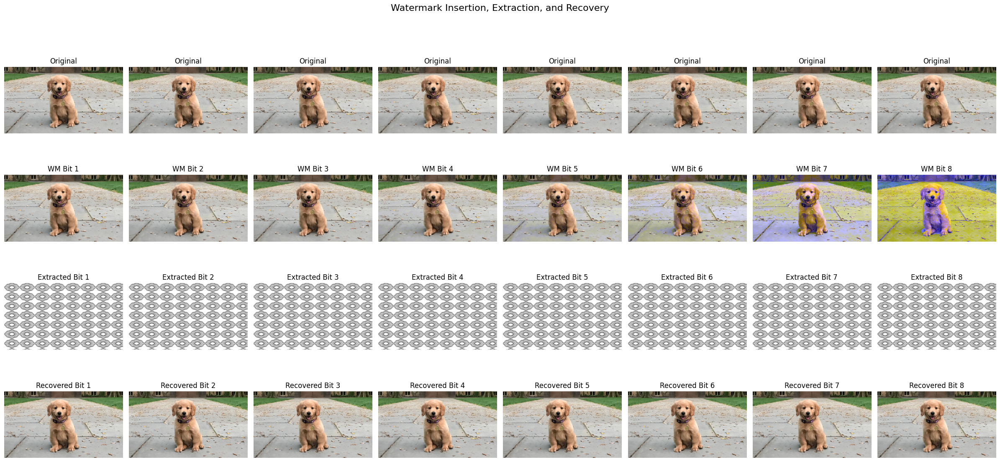

In [342]:

images_wm = []
for bit_value in range(1, 9):
    image_with_text = insert_wm(bigger_image, wm_binary, bit_value)
    images_wm.append(image_with_text)


wms = []
for i in range(8):
    wm = extract_wm(bigger_image, images_wm[i], i+1)
    wms.append(wm)


recovered_images = []
for i in range(8):
    wm = extract_wm(bigger_image, images_wm[i], i+1)  
    rec = recover_original(images_wm[i], wm//255, i+1)  
    recovered_images.append(rec)


fig, axes = plt.subplots(4, 8, figsize=(24, 12))
fig.suptitle('Watermark Insertion, Extraction, and Recovery', fontsize=16)


for i in range(8):
    axes[0, i].imshow(bigger_image)
    axes[0, i].set_title(f'Original')
    axes[0, i].axis('off')

for i in range(8):
    axes[1, i].imshow(images_wm[i])
    axes[1, i].set_title(f'WM Bit {i+1}')
    axes[1, i].axis('off')

for i in range(8):
    axes[2, i].imshow(wms[i], cmap='gray')
    axes[2, i].set_title(f'Extracted Bit {i+1}')
    axes[2, i].axis('off')

for i in range(8):
    axes[3, i].imshow(recovered_images[i])
    axes[3, i].set_title(f'Recovered Bit {i+1}')
    axes[3, i].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()